# CycleGAN para mejora de imágenes submarinas

## Aprendizaje Máquina II

### Esteban Reyes Saldaña

# Resumen

Inspirados en el trabajo https://paperswithcode.com/paper/cycle-dehaze-enhanced-cyclegan-for-single donde se propone una Cyclegan para "Image Dehazing" (eliminar niebla en imágenes), en esta tarea implementaremos una CycleGAN para mejorar imágenes submarinas (under-water image enhancement), ver https://ieeexplore.ieee.org/document/8917818. El código y el dataset esta en https://li-chongyi.github.io/proj_benchmark.html.

Esta solución se desarrolló considerando los conjuntos de imágenes submarinas y restauradas como dos conjuntos independientes y en cada paso entrenar la red usando una imagen submarina y otra restaurada al azar (no coinciden pixel a pixel.)

La arquuitectura de la propuesta es

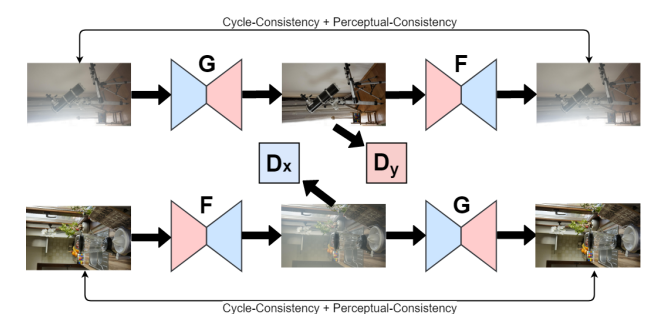

donde $G$ y $ F $ son generadores y $ D_x, D_y $ son discriminadores.

# Librerías

In [315]:
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from argparse import Namespace
import torch

import torch.nn as nn
import functools

import matplotlib.pyplot as plt
import numpy as np

import os
from PIL import Image
import random

import torch.optim as optim

import itertools
import os

Definimos el uso de GPU

In [316]:
device = torch.device('cuda')

In [317]:
torch.cuda.set_device(0)

# Parámetros generales

In [318]:
args   = Namespace()

In [319]:
## log setting
args.data        = '/kaggle/input/uibc890'
args.batch_size  = 3
args.num_workers = 9    

# DataSet

Primero cargaremos el dataset de imágenes submarinas. 

In [320]:
class DehazeDataset(Dataset):
    "Dehazing Dataset"
    def __init__(self, root_dir):
        self.root_dir   = root_dir
        self.train_X    = 'raw-890'
        self.train_Y    = 'reference-890'
        self.X_dir_list = os.listdir(os.path.join(self.root_dir, self.train_X))     # get list of image paths in domain X
        self.Y_dir_list = os.listdir(os.path.join(self.root_dir, self.train_Y))     # get list of image paths in domain Y
        
        random.shuffle(self.X_dir_list)
        random.shuffle(self.Y_dir_list)
        
        self.transforms = self.get_transforms()                                     # get transforms to apply to all images


    def __len__(self):
        assert len(self.X_dir_list) == len(self.Y_dir_list), "Number of files in {} & {} are not the same".format(self.train_X,self.train_Y)
        return len(self.X_dir_list)

    def __getitem__(self,index):
        """Return a data point and its metadata information.
        Parameters:
            index (int)      -- a random integer for data indexing
        Returns a dictionary that contains X, Y, X_paths, Y_paths
            X (tensor)       -- an image in the input domain
            Y (tensor)       -- image in the target (randomly chosen)
            X_paths (str)    -- image pathsinput/uibc890
            Y_paths (str)    -- image paths
        """
        X_img_path = self.X_dir_list[index % len(self.X_dir_list)]  # make sure index is within the range
        # randomize the index for domain Y to avoid fixed pairs.
        ind_Y = random.randint(0, len(self.Y_dir_list) - 1)
        Y_img_path = self.Y_dir_list[ind_Y]
        X_img = Image.open(os.path.join(self.root_dir,self.train_X,X_img_path)).convert('RGB')
        Y_img = Image.open(os.path.join(self.root_dir,self.train_Y,Y_img_path)).convert('RGB')
        # apply image transformation
        X = self.transforms(X_img)
        Y = self.transforms(Y_img)
        return {'X': X, 'Y': Y, 'X_paths': X_img_path, 'Y_paths': Y_img_path}

    def get_transforms(self, resize_to = 286, interpolation = Image.BICUBIC, crop_size = 256):
        """
        Returns 'transforms.Compose object' to apply on images.   Applies resize,randomCrop,
                                                                          randomHorizFlip,toTensor,
                                                                          Normalise
        Args:
            resize_to     : size to resize images
            interpolation : method to resize with
            crop_size     : size to crop images
        """
        all_transforms=[]
        all_transforms.append(transforms.Resize(size=(resize_to,resize_to), interpolation=interpolation))
        all_transforms.append(transforms.RandomCrop(crop_size))
        all_transforms.append(transforms.ToTensor())
        all_transforms.append(transforms.Normalize( (0.5, 0.5, 0.5), (0.5, 0.5, 0.5) ))
        return transforms.Compose(all_transforms)

In [321]:
# create dataset
print('Loading dataset...')
dataset = DehazeDataset(args.data)
print('Dataset loaded successfully...')
print(f'Dataset contains {len(dataset)} distinct datapoints in X(source) & Y(target) domain\n\n')

Loading dataset...
Dataset loaded successfully...
Dataset contains 890 distinct datapoints in X(source) & Y(target) domain




In [322]:
# Create Dataloader
dataloader = DataLoader (dataset, batch_size = args.batch_size,
                                     shuffle = True,
                                 num_workers = args.num_workers)

# make dataset ready for training
print(f'Number of training images = {len(dataset)}')

Number of training images = 890


In [323]:
# SHow single example from dataset
def show_image(x):
    x = (x + 1.) * 127.5
    x = np.transpose(x.squeeze().round().cpu().numpy(), (1, 2, 0)).astype(np.uint8)
    plt.imshow(x)
    plt.show()

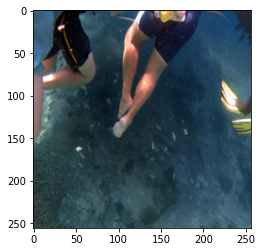

In [324]:
show_image(dataloader.dataset[20]['Y'])

# CyCleGAN

Nuestro modelo consta de dos partes: los generadores y los discriminadores. Los generadores nos ayudarán a crear datos artificiales muy paredicos a los de nuestro dataset, mientras que los discriminadores nos ayudarán a distinguir cuándo un dato es real o no.

## Generator

In [325]:
class Generator(nn.Module):
    """
    Generator model that uses ResNet architecture between upsampling & downsampling layers.
    
    Parms:
    inp        : channels in input image; default=3
    out        : channels in output image; default=3
    res_blocks : number of res-blocks in Resnet; default=6
    """
    def __init__(self,inp = 3,out = 3,res_blocks = 6):
        assert (res_blocks > 0), "There should be atleast 1 ResNet block"
        super(Generator,self).__init__()

        norm_layer = functools.partial(nn.InstanceNorm2d, affine = False, track_running_stats = False)

        model = [nn.ReflectionPad2d(3),                                              #Reflection padding applied to inp image
                 nn.Conv2d(inp, 64, kernel_size=7, padding=0, bias=True),            #7X7 conv applied; 64 filters/output channels
                 norm_layer(64),                                                     #InstanceNorm2D applied
                 nn.ReLU(True),                                                      #Relu activalion applied

                 nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1, bias=True),  #downsampling layer-1
                 norm_layer(128),                                                    #
                 nn.ReLU(True),                                                      #

                 nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1, bias=True), #downsampling layer-2
                 norm_layer(256),                                                    #
                 nn.ReLU(True),                                                      #
                ]
        
        for _ in range(res_blocks):                                                     #add multiple ResNet blocks
            model +=[
                        ResnetBlock(inp_channels = 256, norm_layer = norm_layer, use_dropout = False)
                    ]


        model +=[nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1, bias=True),  #upsampling layer-1
                 norm_layer(128),                                                                                #
                 nn.ReLU(True),                                                                                  #

                 nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1, bias=True),   #upsampling layer-2
                 norm_layer(64),                                                                                 #
                 nn.ReLU(True),                                                                                  #

                 nn.ReflectionPad2d(3),                                              #Reflection padding applied
                 nn.Conv2d(64, 3, kernel_size=7, padding=0),                         #7X7 conv applied; 3 filters/outputs
                 nn.Tanh()                                                           #Tanh activation function used finally

                ]
            
        self.model = nn.Sequential(*model)

    def forward(self, inp):
        """Standard forward pass"""
        return self.model(inp)
                    

class ResnetBlock(nn.Module):
    """Define a Resnet block
    
    Params:
    inp_channel      : mo. channels given as input; default=3
    norm_layer       : normalisation layer to be used
    use_dropout      : whether to use dropout or not; default=False
    """
    def __init__(self, norm_layer, inp_channels = 256, use_dropout = False):
        """Initialize the Resnet block
        A resnet block is a conv block with skip connections
        We construct a conv block ,
        and implement skip connections in <forward> function.
        Original Resnet paper: https://arxiv.org/pdf/1512.03385.pdf
        Parameters:
            inp_channels (int)  -- the number of channels in the conv layer.
            norm_layer          -- normalization layer
            use_dropout (bool)  -- if use dropout layers; default=False
        """
        super(ResnetBlock, self).__init__()
        
        res_block =[                                                                    # 1 full Resnet Block
                        nn.ReflectionPad2d(1),
                        nn.Conv2d(inp_channels, inp_channels, kernel_size=3, padding=0, bias=True),
                        norm_layer(inp_channels),
                        nn.ReLU(True),
            
                        #nn.Dropout(0.5),                                               #dont use dropout- Niranjan
                        nn.ReflectionPad2d(1),
                        nn.Conv2d(inp_channels, inp_channels, kernel_size=3, padding=0, bias=True),
                        norm_layer(inp_channels)
                    ]
        
        self.res_block = nn.Sequential(*res_block)

    def forward(self, inp):
        """Forward pass of thos ResNet block only (with skip connections)"""
        out = inp + self.res_block(inp)                                                 # add skip connections
        return out

## Discriminator

In [326]:
class Discriminator(nn.Module):
    """
    Discriminator class
    """
    def __init__(self,inp=3,out=1):
        """
        Initializes the PatchGAN model with 3 layers as discriminator
        Args:
        inp: number of input image channels
        out: number of output image channels
        """

        super(Discriminator, self).__init__()

        norm_layer = functools.partial(nn.InstanceNorm2d, affine=False, track_running_stats=False)

        model =    [
                        nn.Conv2d(inp, 64, kernel_size=4, stride=2, padding=1),             #input 3 channels
                        nn.LeakyReLU(0.2,True),

                        nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=True),
                        norm_layer(128),
                        nn.LeakyReLU(0.2, True),

                        nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=True),
                        norm_layer(256),
                        nn.LeakyReLU(0.2, True),

                        nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=1, bias=True),
                        norm_layer(512),
                        nn.LeakyReLU(0.2, True),

                        nn.Conv2d(512, out, kernel_size=4, stride=1, padding=1)             #output only 1 channel (prediction map)
                    ]
        self.model = nn.Sequential(*model)

    def forward(self, input):
        """
            Feed forward the image produced by generator through discriminator
            Args:
            input: input image
            Returns:
            outputs prediction map with 1 channel 
        """
        return self.model(input)

## Loss

En el paper principal se proponen dos pérdidas para el modelo CycleGAN, la pérdida de la CycleGAN y la pérdida perceptual. Sean $ x \in X $ y $ y \in Y $ imágenes del conjunto de entrenamiento. Sea $G : X \to Y$ Y $f : Y \to X$ generadores. La formulación de la pérdida de consistencia perceptual está dada por
$$ \mathcal{L}_{perceptual} = || \phi(x) - \phi(F(G(x))) ||^2 _2  + || \phi(y) - \phi(G(F(y))) ||^2 _2 $$$$ 

donde $(x,y)$ se refiere al par de una imagen con niebla y su imagen objetivo. $\phi (\cdot)$ es el extrator de características de la VGG16 en la segunda y quinta capa de polling.

La **Función objetivo de la Cycle-Dehaze** está dada por
$$ \mathcal{L}(G, F, D_x, D_y) = \mathcal{L}_{cycleGAN}(G, F, D_x, D_y) + \lambda \mathcal{L}_{perceptual} (G, F) $$

donde $ \lambda $ controla el efecto de la pérdida perceptual.

In [327]:
from torchvision.models import vgg16

In [328]:
class LSGANLoss(nn.Module) :
    def __init__(self) :
        super().__init__()
        self.loss = nn.MSELoss() 
        
    def __call__ (self, Dx_real, Dx_fake, Dy_real, Dy_fake) :
        return 0.5 * (self.loss(Dx_real, Dx_fake) + self.loss(Dy_real, Dy_fake)  )

In [329]:
class CGANLoss(nn.Module) :
    def __init__(self, args) :
        super().__init__()
        self.loss = nn.L1Loss() 
        self.lamb1 = args.gan_lam1
        self.lamb2 = args.gan_lam2
        
    def __call__ (self, X, FGx, Y, GFy) :
        return self.lamb1 * self.loss(X, FGx) + self.lamb2 * self.loss(Y, GFy)

In [330]:
class perceptual_loss():
    def __init__(self, devicce):
        self.loss   = nn.MSELoss()
        self.device = device
        
        self.vgg16_2 = vgg16(pretrained=True).features[:10].to(device)
        self.vgg16_5 = vgg16(pretrained=True).features.to(device)
        
        for param in self.vgg16_2.parameters():
            param.requires_grad = False
                
        for param in self.vgg16_5.parameters():
            param.requires_grad = False
    def phi(self, x):
        phi1 = self.vgg16_2(x).flatten(start_dim = 1)
        phi2 = self.vgg16_5(x).flatten(start_dim = 1)
        return torch.cat([phi1, phi2], dim = 1)
    
    def __call__ (self, x, x_pred, y, y_pred):
        return self.loss(self.phi(x), self.phi(x_pred)) + self.loss(self.phi(y), self.phi(y_pred))

# Training

Para tener mayor control del efecto de las pérdidas, incluimos parámetros $\alpha, \lambda, \gamma$ que ponderan la pérdida de consistencia, la pérdida de la CycleGAN y la pérdida perceptual, respectivamente.

In [331]:
# Loss Parameters
args.alpha         = 2.0
args.lam           = 1.0
args.gam           = 1e-4
# Loss GAN parameters
args.gan_lam1      = 10.0
args.gan_lam2      = 10.0
# Optimizer parameters
args.learning_rate = 2e-4
args.beta1         = 0.5
args.epochs        = 100

args.dataloader    = dataloader
args.summary       = False

In [332]:
from tqdm.auto  import tqdm

In [333]:
def train(agrs):
    
    # parse data from args passed
    data_dir    = args.data
    batch_size  = args.batch_size
    num_workers = args.num_workers

    #check if data dir exists
    assert os.path.isdir(data_dir), "{} is not a valid directory".format(data_dir)

    # create G, F
    print('Loading Generators(G & F)...')
    G = Generator().to(device)
    F = Generator().to(device)
    print('Generators(G & F) loaded successfully...')

    # create Dx, Dy
    print('Loading Discriminators(Dx, Dy)...')
    Dx = Discriminator().to(device)
    Dy = Discriminator().to(device)
    print('Discriminators(Dx, Dy) loaded successfully...')

    if args.summary :
        print(G)      # print Generator
        print(Dx)     # print Discriminator


    # create 3-loss_functions - Adv_loss, Cycle_consistent_loss, perceptual_loss
    criterionGAN   = CGANLoss(args).to(device)                                       
    criterionCycle = perceptual_loss(device)
    criterionIdt   = LSGANLoss().to(device)

    # create optimizers
    optimizers = []
    optimizer_G = optim.Adam(itertools.chain(G.parameters(), F.parameters()),   lr = args.learning_rate, betas = (args.beta1, 0.999))
    optimizer_D = optim.Adam(itertools.chain(Dx.parameters(), Dy.parameters()), lr = args.learning_rate, betas = (agrs.beta1, 0.999))
    optimizers.append(optimizer_G)
    optimizers.append(optimizer_D)
    
    # Save losses
    loss_CGan_list = []
    losses         = np.array([0., 0., 0., 0.])
            
    # load dataset
    data_loader = args.dataloader
    
    # Show single image progress
    show_image(data_loader.dataset[1]['X'])


    # iterate over dataset for training
    for epoch in range(args.epochs):    # outer loop for different epochs; we save the model by <epoch_count>, <epoch_count>+<save_latest_freq>
        #epoch_start_time = time.time()  # timer for entire epoch
        #iter_data_time = time.time()    # timer for data loading per iteration
        epoch_iter = 0                  # the number of training iterations in current epoch, reset to 0 every epoch
        
        G.train()
        F.train()
        Dx.train()
        Dy.train()
        
        for i, batch in enumerate(tqdm(dataloader)):  # inner loop within one epoch
            optimizers[0].zero_grad()
            optimizers[1].zero_grad()

            X = batch['X'].to(device)
            Y = batch['Y'].to(device)

            Gx      = G(X)
            Dxx     = Dx(X)
            DxGx    = Dx(Gx)
            FGx     = F(Gx)

            Fy      = F(Y)
            Dyy     = Dy(Y)
            DyFy    = Dy(Fy)
            GFy     = G(Fy)
            

            loss_CGan   = criterionGAN(X, FGx, Y, GFy) 
            loss_Id     = criterionIdt(Dxx, DxGx, Dyy, DyFy)
            loss_percep = criterionCycle(Y,GFy, X, FGx)

            loss_CGan_list.append(loss_CGan.detach().item())
            
            # Calculate total loss
            loss_total = args.alpha * loss_Id  + args.lam * loss_CGan + args.gam * loss_percep

            losses[0] += loss_CGan.item()
            losses[1] += loss_Id.item()
            losses[2] += loss_percep.item()
            losses[3] += loss_total.item()


            loss_total.backward()

            optimizers[1].step()
            optimizers[0].step()


        losses /= i+1
        print(f"Total: {losses[-1]:,}\nGAN: {losses[0]:,}  ID: {losses[1]:,}  Percep: {losses[2]:,}")
        losses *= 0.
        
        # Show single image progress
        G.eval()
        im = G(data_loader.dataset[1]['X'].unsqueeze(0).to(device)).detach().cpu()
        show_image(im)

Loading Generators(G & F)...
Generators(G & F) loaded successfully...
Loading Discriminators(Dx, Dy)...
Discriminators(Dx, Dy) loaded successfully...


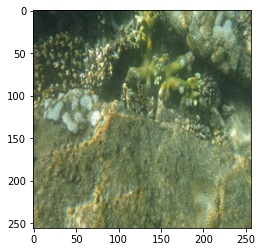

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 5.211933933123194
GAN: 5.141489707259618  ID: 0.03488354910120387  Percep: 6.771411707907012


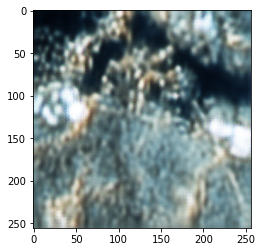

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 4.547037774866277
GAN: 4.544827591289174  ID: 0.0008080474971966059  Percep: 5.940937702904646


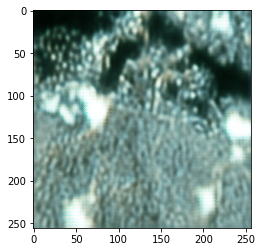

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 4.170879639359034
GAN: 4.169484120828134  ID: 0.0004204636784027384  Percep: 5.545930213799782


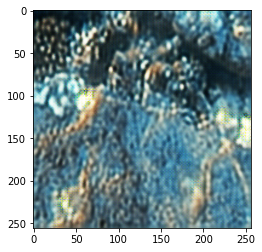

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.9002600029261427
GAN: 3.899239744000162  ID: 0.00024987115804576363  Percep: 5.205097509152962


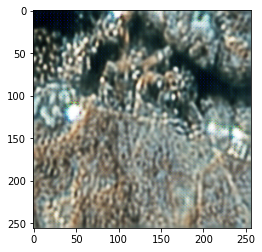

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.69974422454834
GAN: 3.6988409496718386  ID: 0.00019863923310548356  Percep: 5.059994576354621


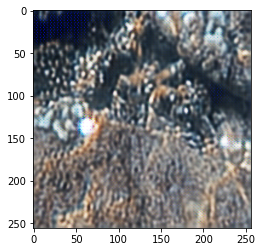

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.6689111568309642
GAN: 3.6571421229879464  ID: 0.005637852105026694  Percep: 4.933350914656514


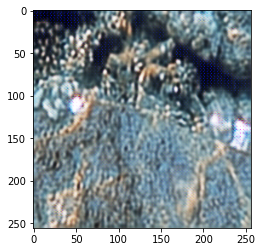

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.528876042927957
GAN: 3.527719861329204  ID: 0.0003401120126545108  Percep: 4.7595729771687925


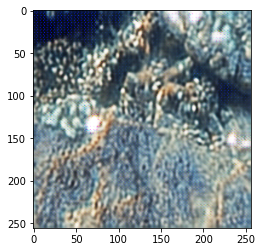

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.419786731000701
GAN: 3.4177336516203702  ID: 0.0007940082457947454  Percep: 4.650536804488211


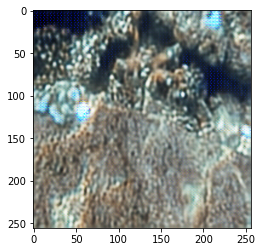

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.3727907717027246
GAN: 3.3717527558105163  ID: 0.00029169172831040397  Percep: 4.5463339624180135


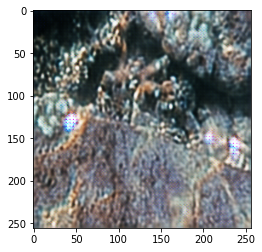

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.273290764201771
GAN: 3.2723541211600256  ID: 0.0002457038983192608  Percep: 4.452304172194767


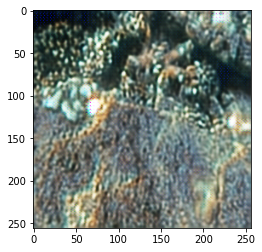

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 4.836921789028026
GAN: 4.413696818078808  ID: 0.2113329144263562  Percep: 5.591381848460496


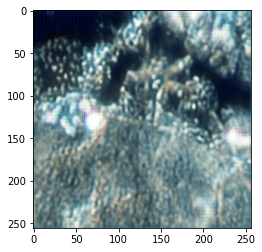

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.579068731378626
GAN: 3.5775519509106775  ID: 0.0005219179312996441  Percep: 4.729467415247702


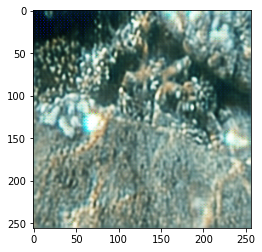

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.3714934125893845
GAN: 3.370507658531369  ID: 0.0002725115959197032  Percep: 4.4073800189727885


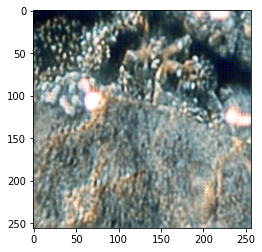

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.244839573548699
GAN: 3.2440365259896224  ID: 0.0001860641449476633  Percep: 4.309292273890692


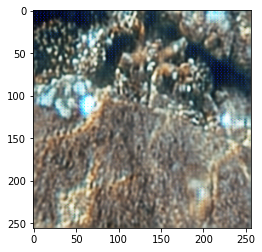

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.1980424617677423
GAN: 3.1973079302495577  ID: 0.00015458351549951544  Percep: 4.253629058298438


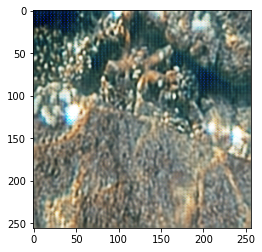

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.1007687499627523
GAN: 3.1001324244219846  ID: 0.00011132199165867156  Percep: 4.136777550283105


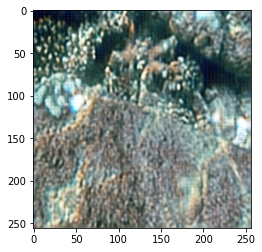

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.0497329030374085
GAN: 3.049171130665224  ID: 7.987767181745127e-05  Percep: 4.020199823058414


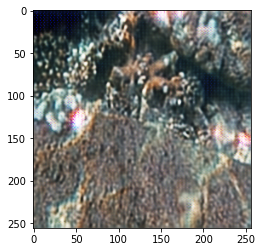

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 3.047215522740425
GAN: 3.046682847469343  ID: 6.434520290702383e-05  Percep: 4.039779439919726


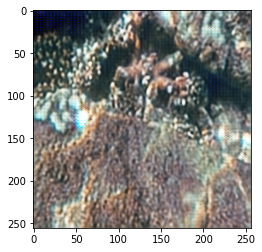

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.998090269991043
GAN: 2.9975713776418256  ID: 5.953270264206257e-05  Percep: 3.9983788146715775


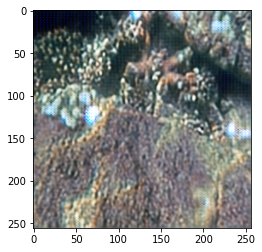

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.9767776057375
GAN: 2.976293926688557  ID: 5.022485602729576e-05  Percep: 3.8322347229980056


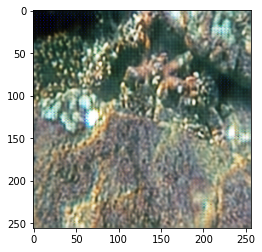

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.913173773473361
GAN: 2.912700860990017  ID: 4.372644897640302e-05  Percep: 3.8545769794220073


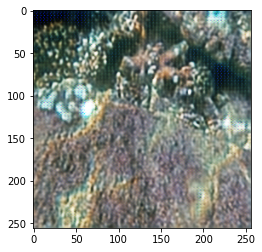

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.8695006928459965
GAN: 2.8690183459708987  ID: 5.271964502190232e-05  Percep: 3.7690664485648826


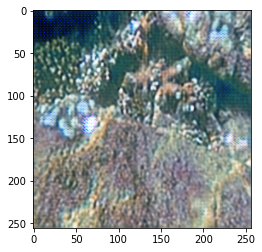

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.8451009671696106
GAN: 2.8446544348591507  ID: 3.71481390493653e-05  Percep: 3.722302648756239


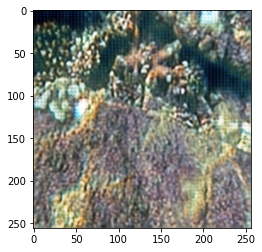

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.776022200632577
GAN: 2.7755958893483736  ID: 2.934098284772318e-05  Percep: 3.676274151914449


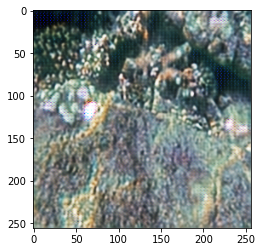

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.8170423078215885
GAN: 2.8166134072473956  ID: 2.94535790573706e-05  Percep: 3.699878863614015


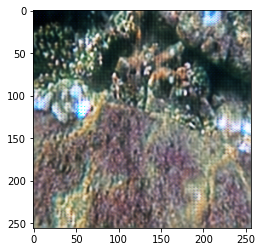

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.7804273603741168
GAN: 2.780019431403189  ID: 2.4615682916730833e-05  Percep: 3.586988517330953


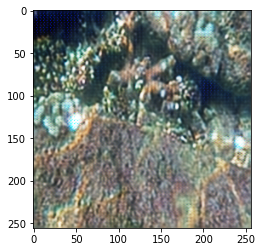

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.726313110955235
GAN: 2.725762699589585  ID: 9.711143141458072e-05  Percep: 3.5619021244723386


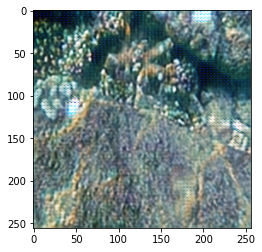

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.717225701720626
GAN: 2.71661680595642  ID: 0.00012500393407235882  Percep: 3.588847344170516


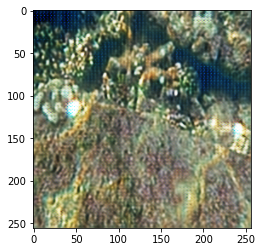

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.661677339663008
GAN: 2.6606040960209136  ID: 0.00036042041139550904  Percep: 3.5240373402733596


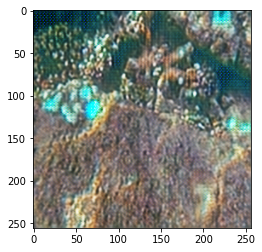

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.648020697763873
GAN: 2.6469266230008417  ID: 0.00037323253004293715  Percep: 3.4761056101282035


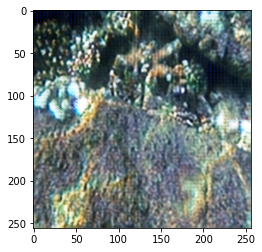

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.606991008877353
GAN: 2.6065661393432102  ID: 3.8107952432041485e-05  Percep: 3.486575966732269


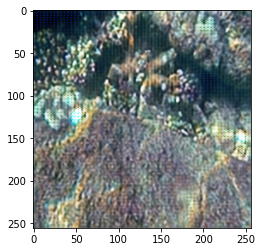

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.607109633359042
GAN: 2.604708002472566  ID: 0.0010288173630980738  Percep: 3.440009514490763


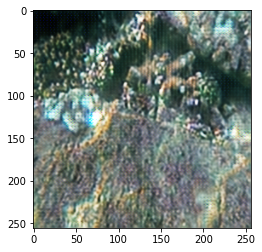

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.562668537049984
GAN: 2.5620291068497734  ID: 0.00015217824026267376  Percep: 3.3508144444488113


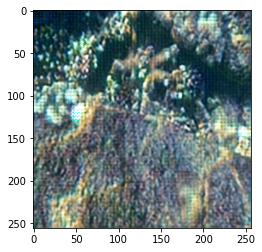

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.5746238127300636
GAN: 2.5728699205700396  ID: 0.0007096438622048245  Percep: 3.345937723262543


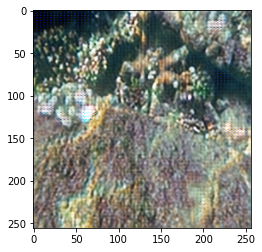

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.9638159937328763
GAN: 2.8264116145143605  ID: 0.0685194582693144  Percep: 3.6545324831297905


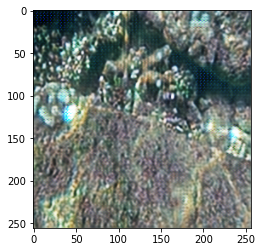

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.5722041274562026
GAN: 2.5715303148083413  ID: 0.00016696434421239418  Percep: 3.398884895273331


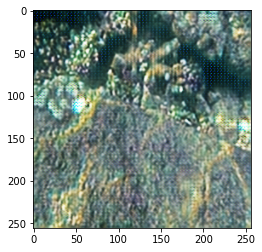

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.518499296522301
GAN: 2.5179488915787  ID: 0.0001087371920986471  Percep: 3.329247241068368


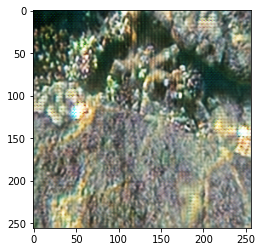

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.528865836686157
GAN: 2.528391107164248  ID: 7.086338096408813e-05  Percep: 3.3300646788343435


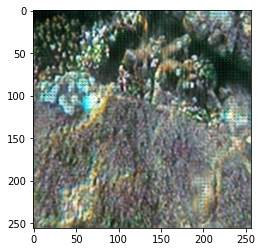

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.4293970154592084
GAN: 2.4289763318970548  ID: 4.771401357845547e-05  Percep: 3.252583616510385


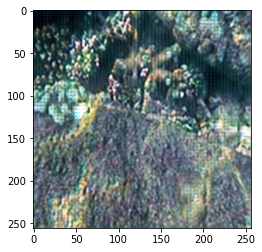

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.411514568810511
GAN: 2.411116273716243  ID: 3.611104063630325e-05  Percep: 3.260772026347793


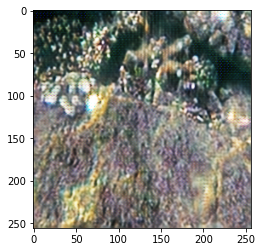

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.426770846450369
GAN: 2.426374912663341  ID: 3.460460898734614e-05  Percep: 3.2671919880491314


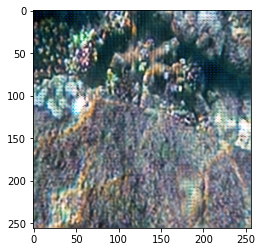

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.421178745099591
GAN: 2.4149329036173195  ID: 0.002964824347993872  Percep: 3.1619355104587696


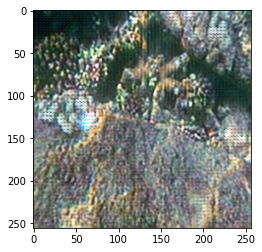

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.385991342541345
GAN: 2.385592414875223  ID: 3.8994696694963235e-05  Percep: 3.2093613942464194


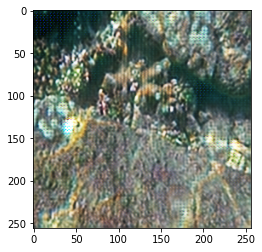

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.370757468621739
GAN: 2.3700494180223357  ID: 0.0001954632720611184  Percep: 3.17130871694096


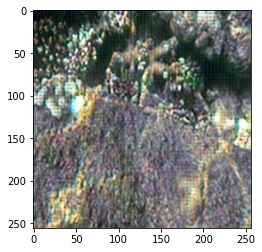

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.32042612772598
GAN: 2.319883609861637  ID: 0.00011483140756982026  Percep: 3.128540361369098


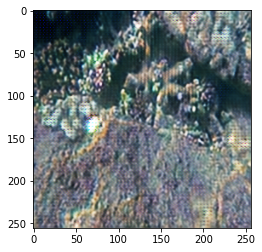

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.3229207775809546
GAN: 2.3225820562253494  ID: 1.3398839213066834e-05  Percep: 3.1192169297825205


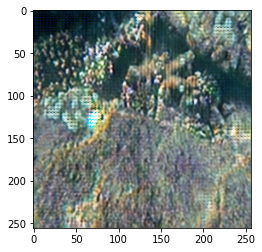

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.3013110518054125
GAN: 2.299769077236805  ID: 0.0006172375144898476  Percep: 3.074970096851439


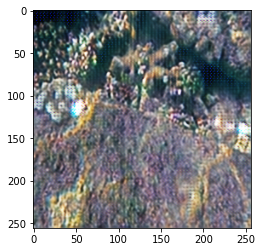

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.2715317954118004
GAN: 2.271171115865611  ID: 2.6034303218173235e-05  Percep: 3.0860717710019765


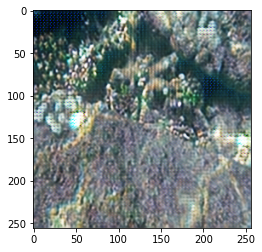

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.2977510229104294
GAN: 2.2972763122532904  ID: 8.522490395879493e-05  Percep: 3.042651916995193


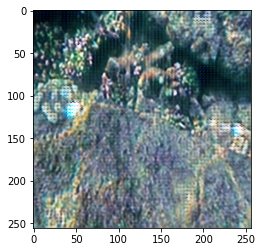

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.254798984286761
GAN: 2.254468367557333  ID: 1.3321384212820103e-05  Percep: 3.039725892872923


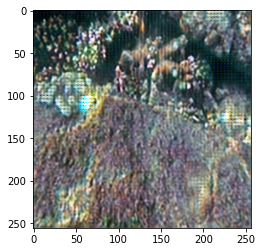

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.7760208969565756
GAN: 2.5572607328594734  ID: 0.1092143983414223  Percep: 3.313762482970652


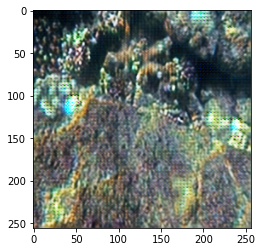

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.2818551220075047
GAN: 2.280747088920388  ID: 0.0004024264660261349  Percep: 3.03180166527077


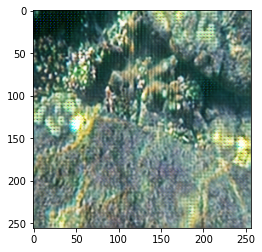

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.2278452132286044
GAN: 2.2271848001865426  ID: 0.00017735585499535666  Percep: 3.0570035992246685


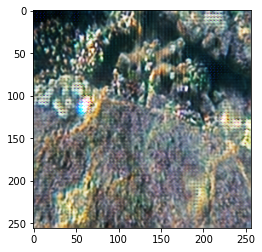

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.2281491258730393
GAN: 2.227640242688985  ID: 0.00010551274760966486  Percep: 2.9785834546843764


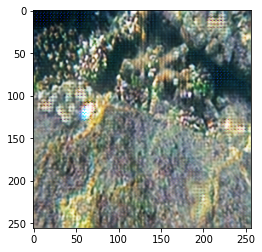

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.1992602793857303
GAN: 2.198830186317264  ID: 6.740424943333711e-05  Percep: 2.9529473448441887


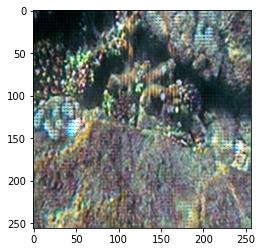

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.1736008137564866
GAN: 2.1732084401930223  ID: 4.940047656786228e-05  Percep: 2.935699508647726


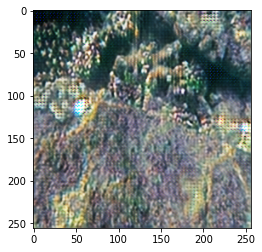

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.131074067318078
GAN: 2.130696552369731  ID: 4.212419991396165e-05  Percep: 2.932681532419892


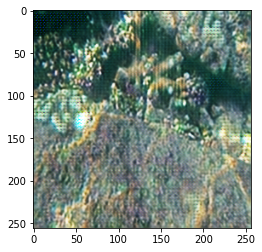

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.162890101121331
GAN: 2.162526492719297  ID: 3.4863951490362575e-05  Percep: 2.938788627935981


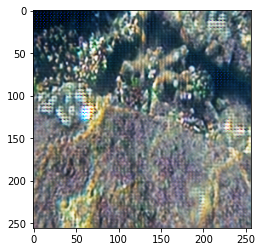

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.1119585755698207
GAN: 2.111609782032694  ID: 2.817760356963551e-05  Percep: 2.9243457530082675


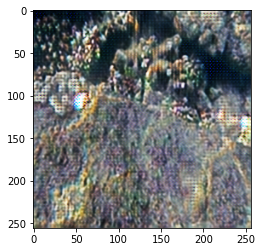

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.1172360860137425
GAN: 2.1168885893291898  ID: 2.7836042592465222e-05  Percep: 2.918272113559222


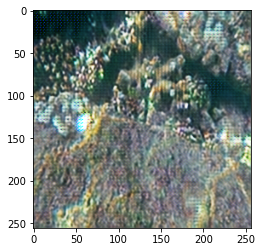

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.113618598642574
GAN: 2.113187327128067  ID: 7.158924575497907e-05  Percep: 2.8809504581220224


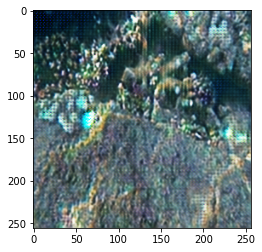

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.078922502119533
GAN: 2.078536773771549  ID: 4.9661021824032054e-05  Percep: 2.8640397871383514


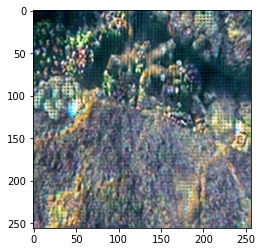

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.0915768584017
GAN: 2.091250678104182  ID: 2.0064596683614e-05  Percep: 2.8604832883635756


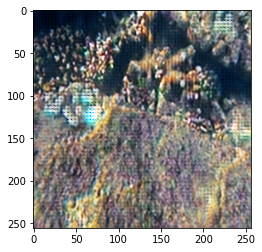

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.0535987912605105
GAN: 2.05301912143977  ID: 0.00014872629546412575  Percep: 2.822119942417851


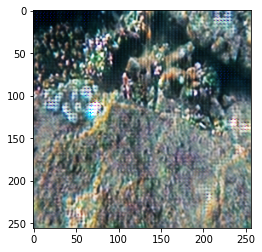

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.0454597176124754
GAN: 2.0451141363041168  ID: 3.003962317331022e-05  Percep: 2.8549933469656743


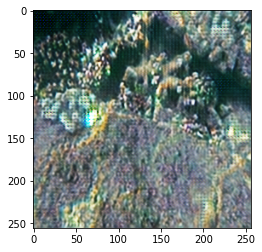

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.0386407299073857
GAN: 2.037783491089689  ID: 0.0002869655166844676  Percep: 2.83307229990911


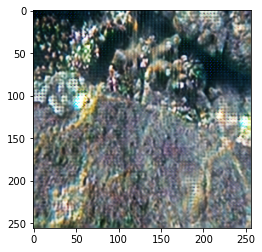

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.00423042782228
GAN: 2.0038700910529705  ID: 3.9691791736993346e-05  Percep: 2.809550748931037


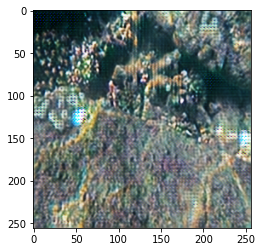

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.121553416203971
GAN: 2.06795586841275  ID: 0.026654489462210218  Percep: 2.885683349085978


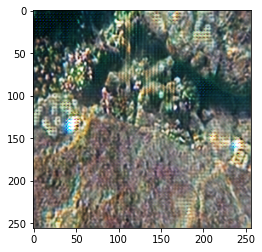

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 2.011700031331894
GAN: 2.0110607636898052  ID: 0.00017825749487216703  Percep: 2.827567778452478


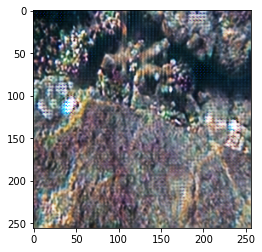

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.9850585697475909
GAN: 1.984604669741107  ID: 8.68328026951442e-05  Percep: 2.802410415126017


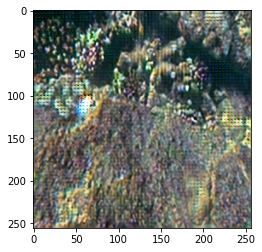

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.9670976360237558
GAN: 1.966624090567181  ID: 9.779186640003373e-05  Percep: 2.7796221473803024


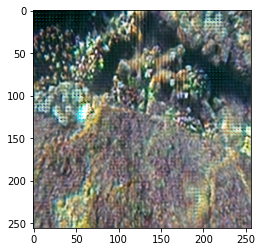

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.9632589788950654
GAN: 1.9627805402383258  ID: 0.00010052705368341452  Percep: 2.773840400907728


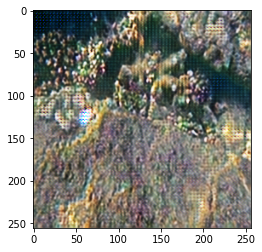

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.934681981500953
GAN: 1.9343230804610332  ID: 4.2354427859383504e-05  Percep: 2.7419166922167895


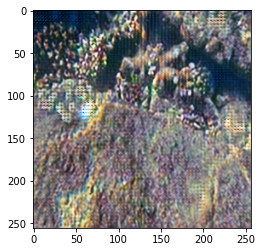

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.9251643214562926
GAN: 1.9247409049107973  ID: 7.613041871633014e-05  Percep: 2.7115287299108024


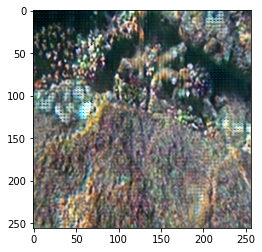

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.8806808572826963
GAN: 1.8802527016662187  ID: 8.072817646319683e-05  Percep: 2.666967909344118


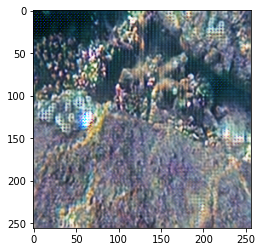

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.9161616977216418
GAN: 1.9155413891731288  ID: 0.00017466697609542025  Percep: 2.709747958263564


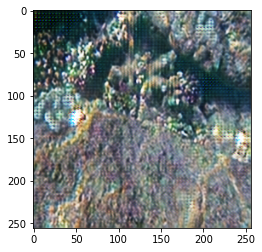

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.9018812039083102
GAN: 1.9011325703726873  ID: 0.00023986296628055834  Percep: 2.689058607274836


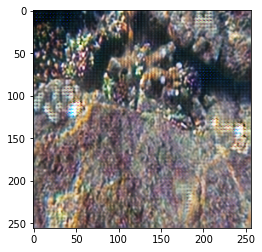

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.901923368274162
GAN: 1.901112078416227  ID: 0.00027041075459191685  Percep: 2.7047717587313667


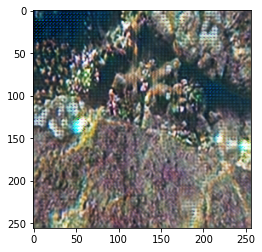

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.9895428688036472
GAN: 1.9479115426741065  ID: 0.020678296333057563  Percep: 2.747405425466672


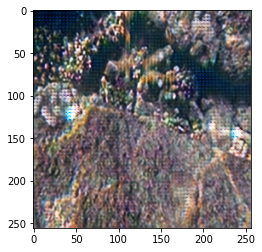

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.8731470966981316
GAN: 1.8726164692580098  ID: 0.00013061797886523214  Percep: 2.693884100978222


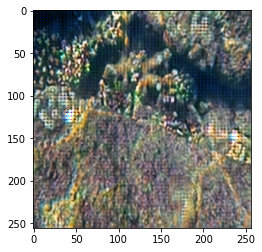

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.8453822003470526
GAN: 1.845018374799478  ID: 5.0047844252127745e-05  Percep: 2.63725983695149


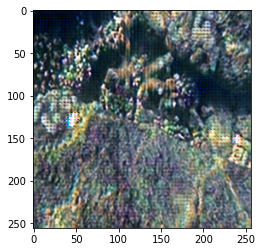

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.829326700682592
GAN: 1.8289810487316915  ID: 4.004185164511135e-05  Percep: 2.6556901269488864


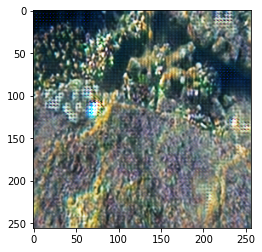

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.7886700321126867
GAN: 1.7883244560222433  ID: 4.325841241353505e-05  Percep: 2.590557139730614


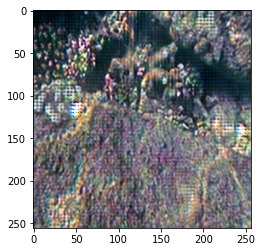

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.799409240183204
GAN: 1.7990961536413892  ID: 2.7632860774828923e-05  Percep: 2.578196912903577


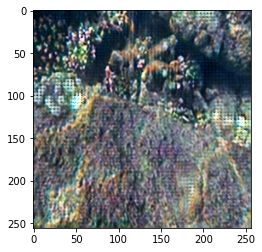

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.7908818561220008
GAN: 1.7905676019713535  ID: 2.729561508972545e-05  Percep: 2.5966180185677628


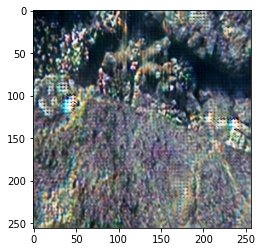

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.7856481986415105
GAN: 1.7853394883248943  ID: 2.5183495589732256e-05  Percep: 2.58346132878904


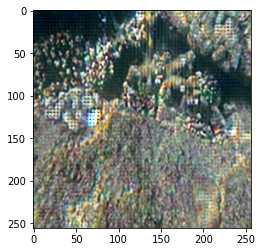

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.7875696741772018
GAN: 1.7872027821011014  ID: 5.2617108475920386e-05  Percep: 2.6165711325828473


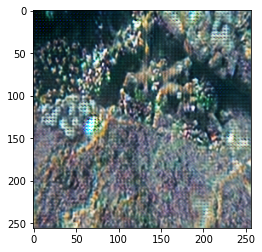

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.78172624432278
GAN: 1.781189521555146  ID: 0.00014021242502323472  Percep: 2.562966540204957


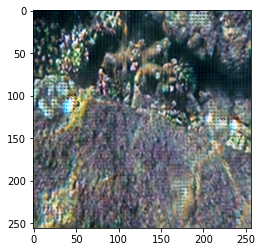

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.7832888541398224
GAN: 1.7829129904608936  ID: 5.871796823307689e-05  Percep: 2.5842311037108554


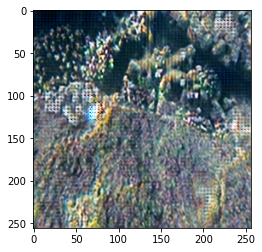

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.7597825334529684
GAN: 1.7594964464104135  ID: 1.5468331887611633e-05  Percep: 2.5515070346870807


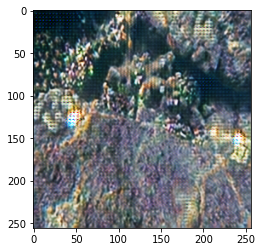

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.8056467117283883
GAN: 1.7849486006630793  ID: 0.010219508017379903  Percep: 2.5909727779703107


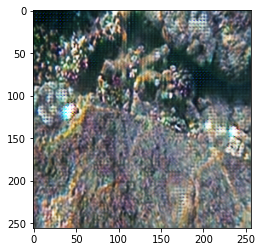

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.7160764230220809
GAN: 1.7157596281481913  ID: 3.19855188618848e-05  Percep: 2.528294952630194


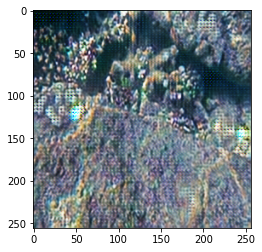

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.730705652574096
GAN: 1.730403685007834  ID: 2.5517396964824615e-05  Percep: 2.509337746735775


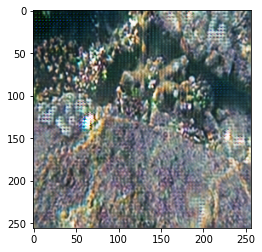

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.6959576980032103
GAN: 1.695195749552563  ID: 0.0002517038427368951  Percep: 2.5854250112366595


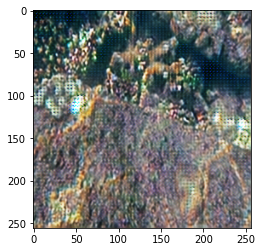

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.685685249290081
GAN: 1.6848193254535047  ID: 0.00030835015913510043  Percep: 2.492253905996329


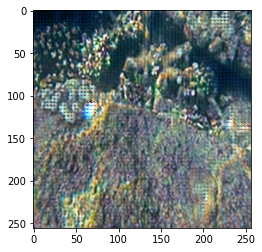

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.6898437152406582
GAN: 1.6882425847679678  ID: 0.0006771736971453297  Percep: 2.467760275108646


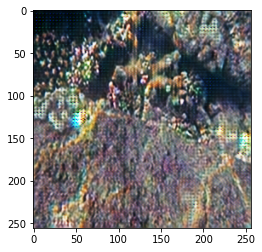

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.6915152578642874
GAN: 1.6910606229345406  ID: 0.00010356125230766938  Percep: 2.4751442931717893


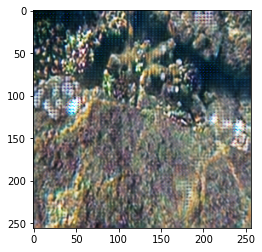

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.6923269623457784
GAN: 1.6920524474346277  ID: 1.3281708755862123e-05  Percep: 2.479534563793478


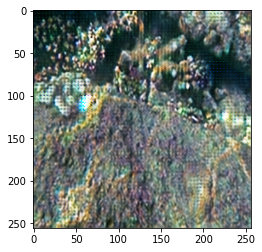

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.6859582265218098
GAN: 1.6856880055533514  ID: 1.0736296257231583e-05  Percep: 2.4874966891124997


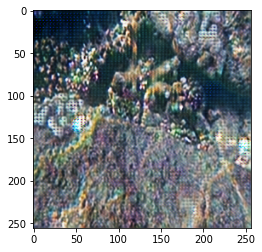

  0%|          | 0/297 [00:00<?, ?it/s]

Total: 1.6885070885070648
GAN: 1.6874058780445393  ID: 0.00042633660483745175  Percep: 2.485401562167338


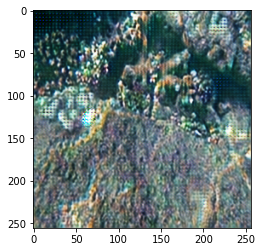

In [334]:
train(args)

# Conclusiones

La arquitectura de la cycleGAN para quitar neblina funcionó tamibén para mejorar imágenes submarinas. Combinar estas tres pérdidas permite a la retro propagación mejorar los resultados. Se observó también que en la época 40 los resultados cualitativos fueron mejores en comparación a las últimas épocas donde agrega ruido a la imagen. Esto podría deberse a la distancia que se usa para comparar la imagen generada y la real. 

Se observó además que la elección de pesos para las pérdidas juega un papel importante, siendo la pérdida de la cyclegan la más importante y la perceptual parece tene rpoca influenciad en los resultados.
